In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## LoveDA

Google Earth Engine. 2522 imágenes de 1024x1024 píxeles. 6 clases: fondo, edificio, árbol muerto, árbol vivo, suelo y agua. Imágenes de zonas urbanas y rurales.
Presentado inicialmente en Neurips 2021. Tiene cerca de 771 citas en Google Scholar.

LoveDA: A Remote Sensing Land-Cover Dataset for Domain Adaptive Semantic Segmentation. Neurips 2021.



In [3]:
from torchgeo.datasets import LoveDA
from utils import show_image_and_mask_from_tensor

train_data = LoveDA(
    root="data",
    scene=["urban", "rural"],
    download=True,
)
len(train_data)


Files already downloaded and verified


2522

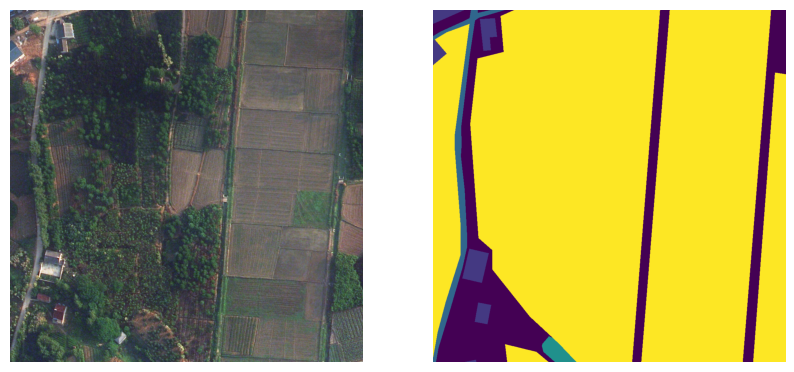

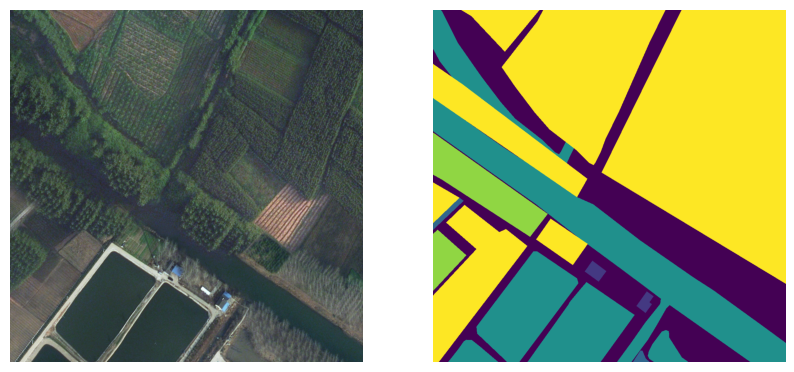

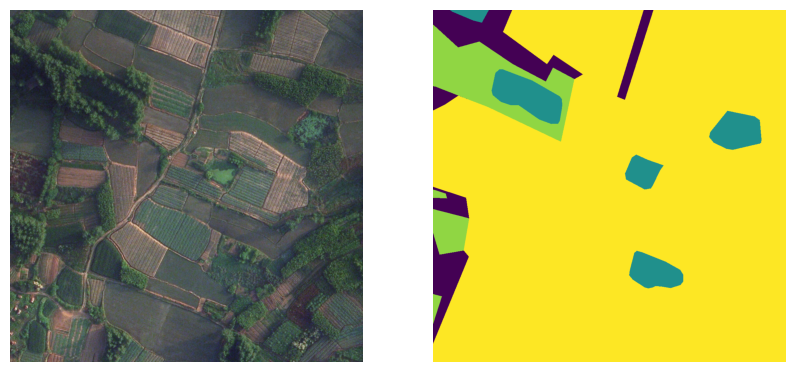

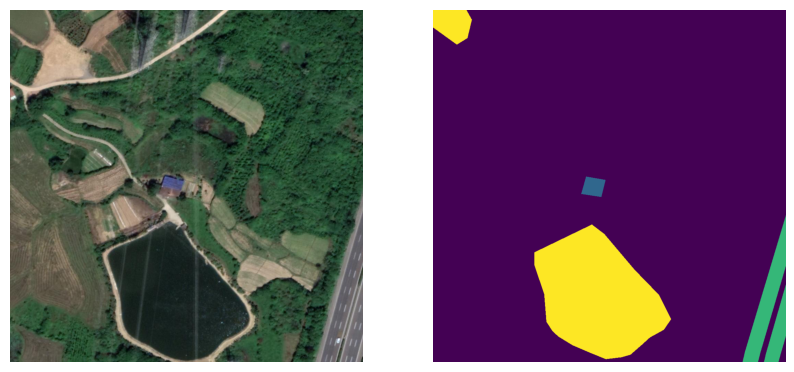

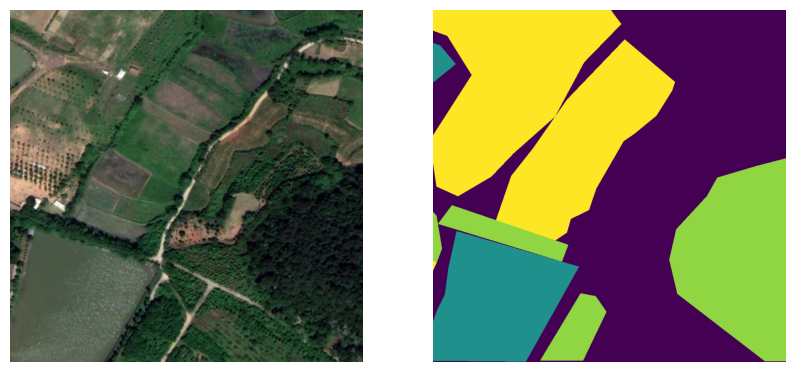

...

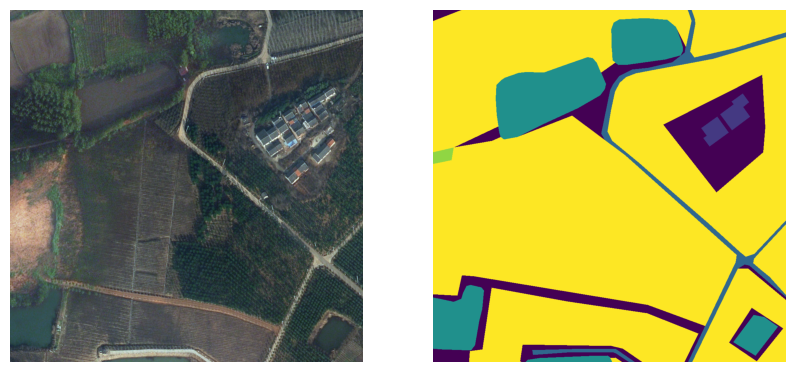

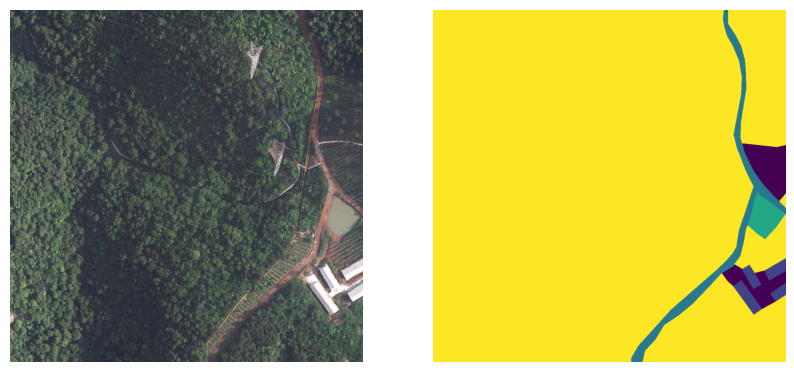

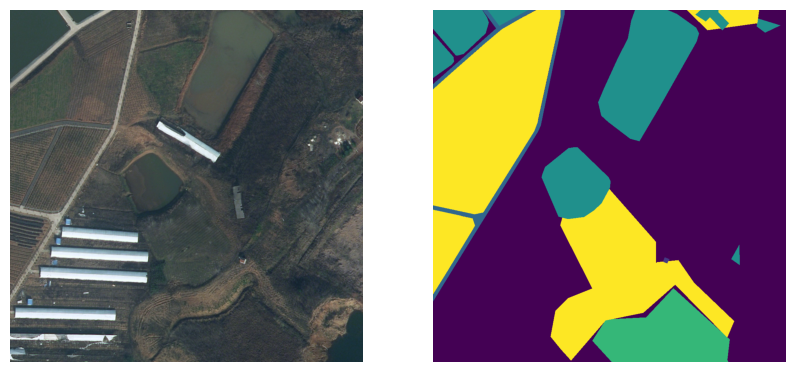

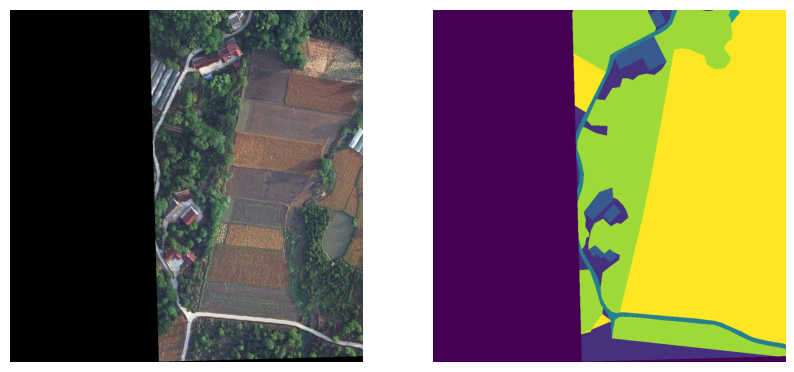

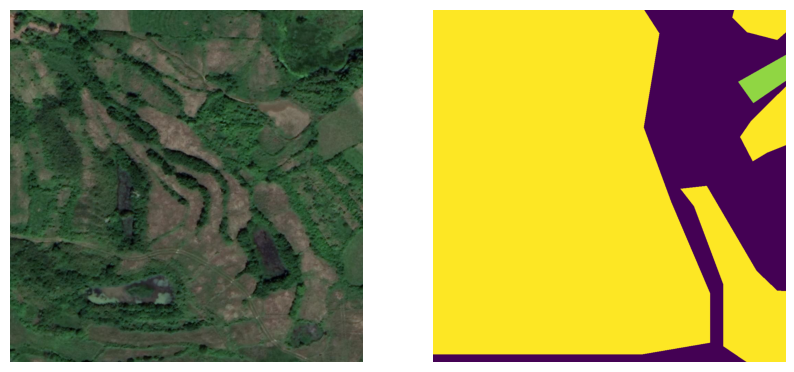

In [4]:
for id in range(20):
    show_image_and_mask_from_tensor(train_data, id)

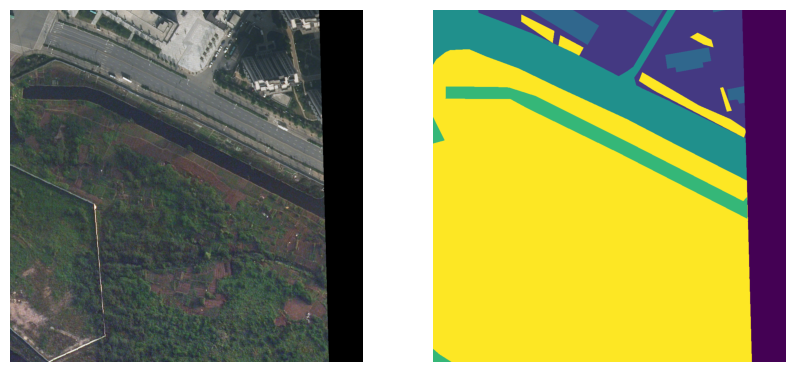

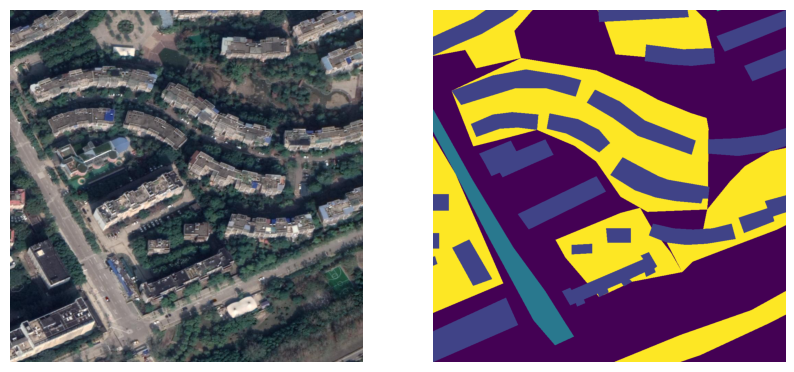

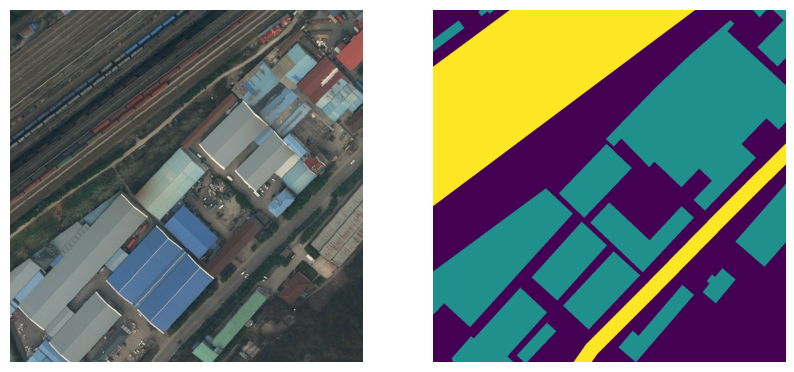

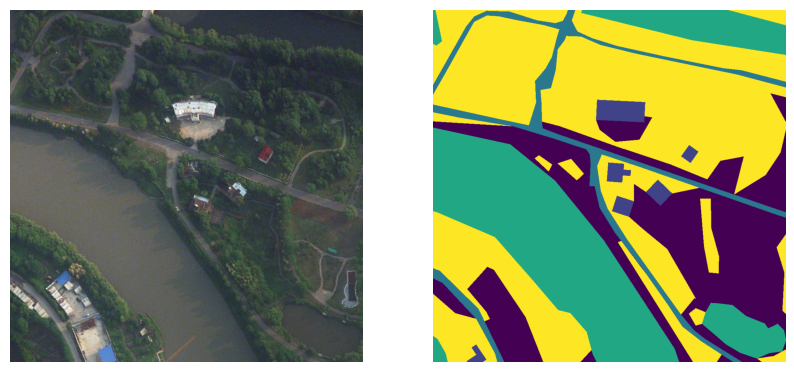

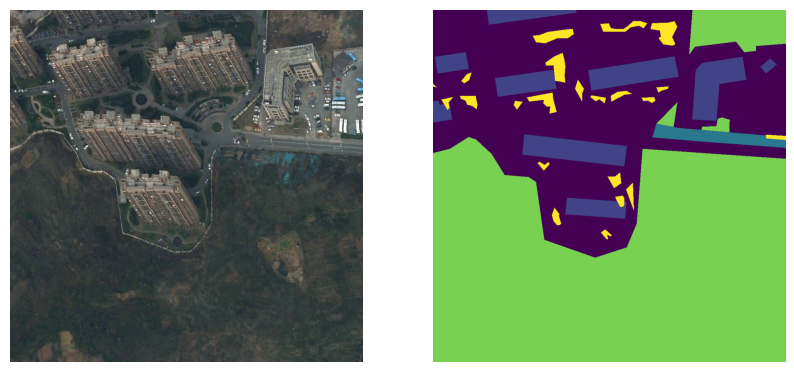

...

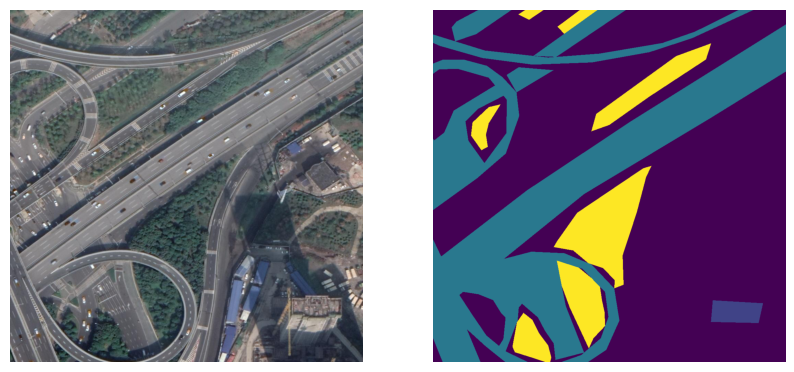

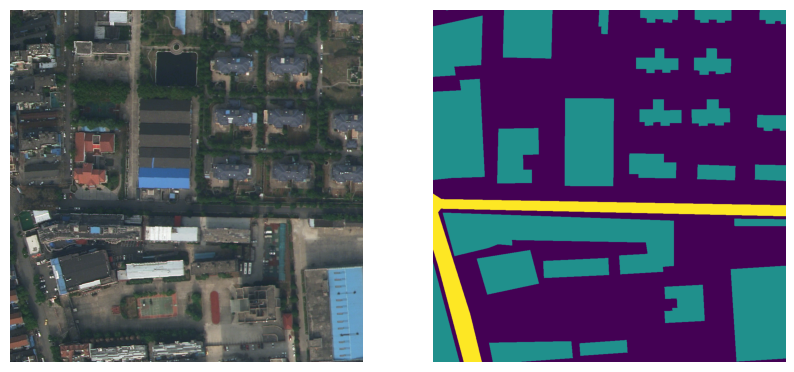

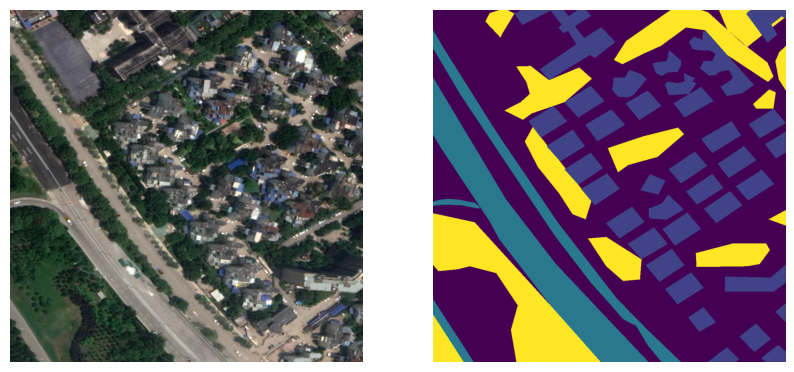

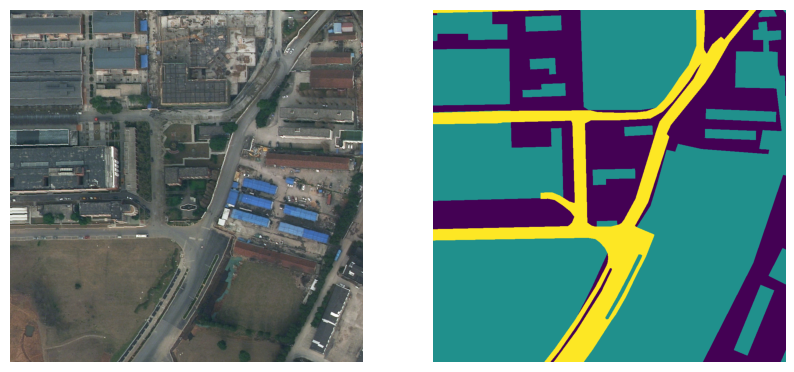

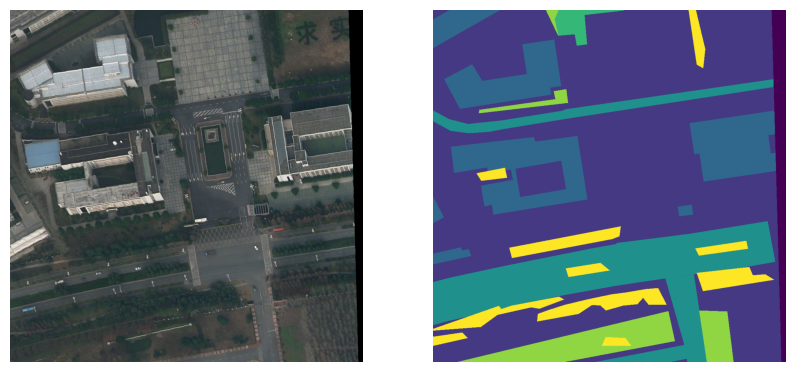

In [6]:
for id in range(-20, 0, 1):
    show_image_and_mask_from_tensor(train_data, id)

In [ ]:
from torchgeo.datasets import LoveDA
from pathlib import Path
import glob
from splitters.split_utils import create_split_folders

ROOT = "loveda_dataset"

train_data = LoveDA(
    root=ROOT,
    split="train",
    scene=["urban", "rural"],
    download=True,
)
val_data = LoveDA(
    root=ROOT,
    split="val",
    scene=["urban", "rural"],
    download=True,
)
test_data = LoveDA(
    root=ROOT,
    split="test",
    scene=["urban", "rural"],
    download=True,
)


DATASET_NAME = "loveda_dataset"
TRAIN_FOLDER = f"{DATASET_NAME}/train"
VAL_FOLDER = f"{DATASET_NAME}/val"
TEST_FOLDER = f"{DATASET_NAME}/test"


train_images = [Path(p) for p in glob.glob(f"{DATASET_NAME}/Train/*/images_png/*")]
val_images = [Path(p) for p in glob.glob(f"{DATASET_NAME}/Val/*/images_png/*")]
test_images = [Path(p) for p in glob.glob(f"{DATASET_NAME}/Test/*/images_png/*")]

val_masks = [Path(p) for p in glob.glob(f"{DATASET_NAME}/Val/*/masks_png/*")]
train_masks = [Path(p) for p in glob.glob(f"{DATASET_NAME}/Train/*/masks_png/*")]
test_masks = [Path(p) for p in glob.glob(f"{DATASET_NAME}/Test/*/masks_png/*")]


Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [16]:
print("[bold blue] Proceeding with file move... [/bold blue]")
create_split_folders(TRAIN_FOLDER, images=train_images, masks=train_masks)
create_split_folders(VAL_FOLDER, images=val_images, masks=val_masks)
create_split_folders(TEST_FOLDER, images=test_images, masks=test_masks)

[bold blue] Proceeding with file move... [/bold blue]


NameError: name 'create_split_folders' is not defined